In [1]:
import nibabel as nib
import numpy as np
import matplotlib.pylab as plt
import sys
import scipy.optimize as spopt
import scipy.fftpack as spfft
import scipy.ndimage as spimg
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
sys.path.append('../../src/')

# custom scripts
import mri_cs
from visualization import plot_batch
from helpers import get_fourier_transform
from spiraltrajectory import spiral_samples_trajectory, kspace_measurements_spiral, minimum_energy_reconstruction
# from mri_cs import lpminimization, hermitian

from tqdm import tqdm
from matplotlib.colors import LogNorm
from numpy.fft import fft2, fftshift
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

layout = go.Layout(template="plotly_dark")
fig = go.Figure(layout=layout)
templated_fig = pio.to_templated(fig)
pio.templates['my_template'] = templated_fig.layout.template
pio.templates.default = 'my_template'

py.init_notebook_mode()

## K-space Spiral Trajectory

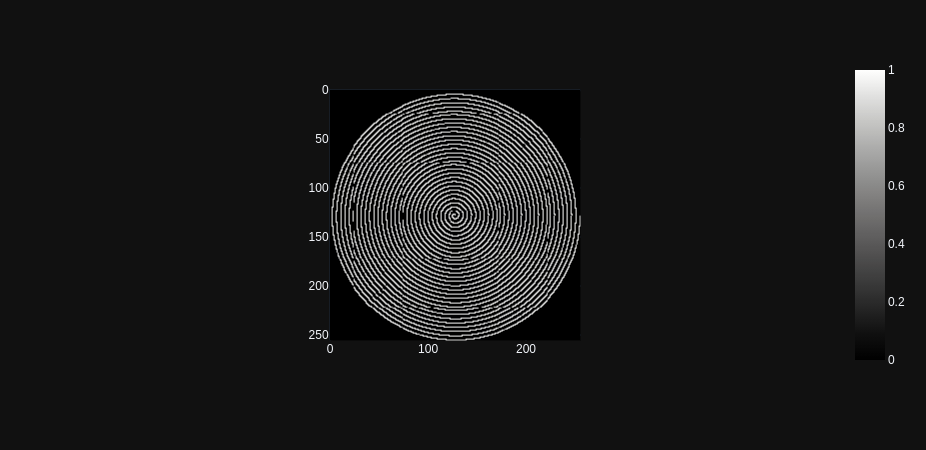

In [6]:
img_size = 256
samples_rows, i, j, I =  spiral_samples_trajectory(width=img_size, height=img_size, n_turns=30)

px.imshow(np.fft.fftshift(I), color_continuous_scale='gray')

# Images to be reconstructed

(257, 257)

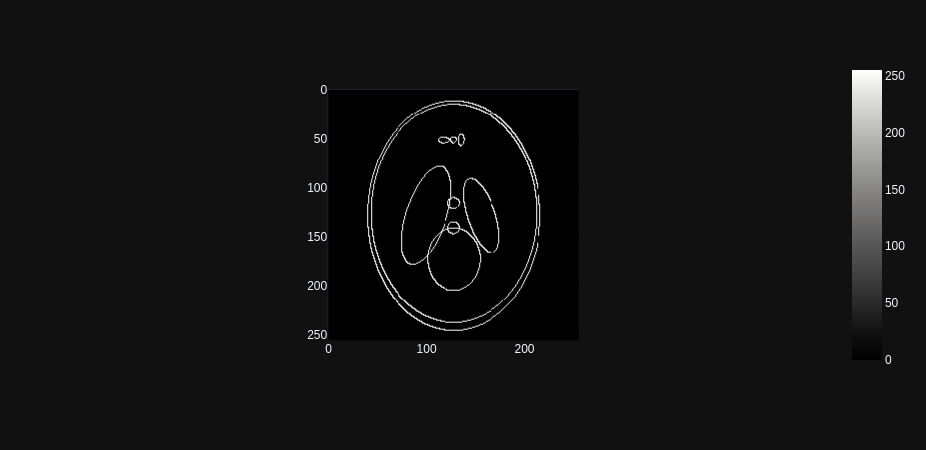

(257, 256)

(256, 257)

(256, 256)

In [11]:
from phantominator import shepp_logan

phantoma = shepp_logan(256)

img_ = np.zeros((img_size+1, img_size+1))
img_.shape

# sparsification process
img_[1:, 1:] = phantoma
img_hor = img_[:, 1:] - img_[:, :-1]
img_ver = img_[1:, :] - img_[:-1, :]
complex_img = img_hor[1:, :] + img_ver[:, 1:] * 1j

abs_img = np.abs(complex_img)
px.imshow(abs_img > 0, color_continuous_scale="gray")

img_hor.shape
img_ver.shape
complex_img.shape

# Measurements from the image to be reconstructed

In [63]:
# samples_rows
img_hat = np.fft.fft2(abs_img)
img_hat.shape

stacked_img_hat = img_hat.flatten().copy()
stacked_img_hat.shape

# measurements to be used
b = stacked_img_hat[samples_rows]
b.shape
b

(256, 256)

(65536,)

(15231,)

array([1459.58808542 +0.j        ,   67.83891436 -5.96088793j,
       -244.77116325 -6.082871j  , ..., -294.32429286+35.4324112j ,
        135.17242226 -0.40138786j, -317.54980216+14.38207544j])

# Image reconstruction

In [64]:
# reconstrucao do sinal a partir das medidas
A_ = lambda x: np.fft.fft2(np.reshape(x, (img_size, img_size))).flatten()[samples_rows]

# transposta conjugada
def a(x):
    a = np.reshape(x, (img_size, img_size))
    a = np.fft.fft2(a)
    a = a.flatten()[samples_rows]
    return a

def ah(x):
    x = fill_with_zeros(x, samples_rows, img_size)
    x = np.fft.ifft2(x)
    x = x * (img_size * img_size)
    x = x.flatten()
    return x

def fill_with_zeros(x, samples_rows, img_size):
    y = np.zeros((img_size * img_size)) * 1j

    y[samples_rows] = x
    y = np.reshape(y, (img_size, img_size))
    
    return y

In [65]:
import importlib
importlib.reload(mri_cs)

img_hat_r = mri_cs.lpminimization(A_, Ah=ah, b=b, p=1, N=(img_size * img_size), verbose=False)

<module 'mri_cs' from '../../src/mri_cs.py'>

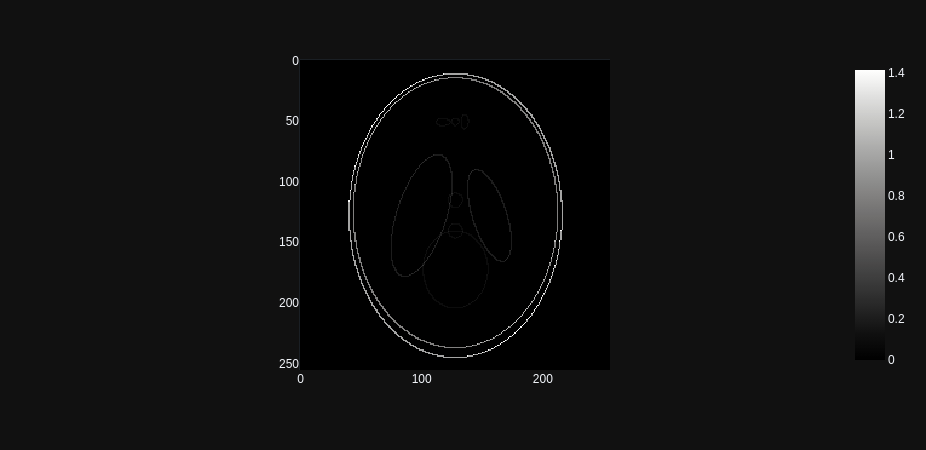

In [66]:
img_r = np.reshape(img_hat_r, (img_size, img_size))
img_real = np.real(img_r)
px.imshow(np.abs(img_real), color_continuous_scale='gray')

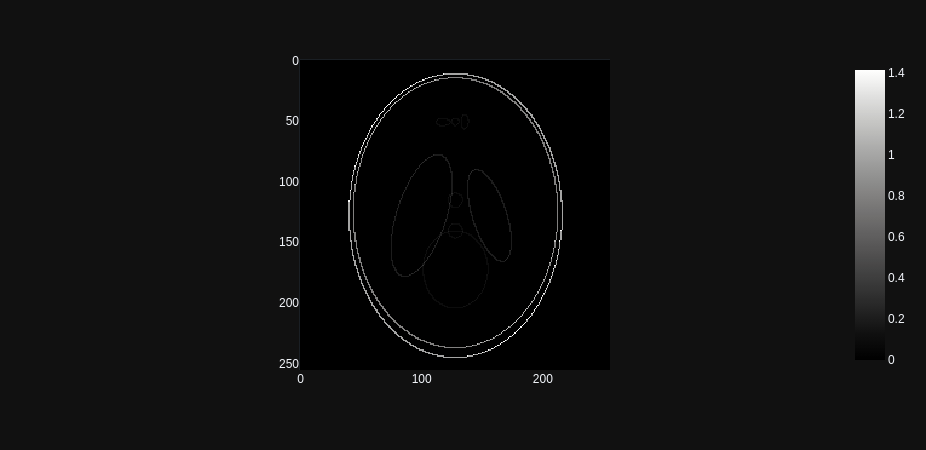

In [44]:
img_r = np.reshape(img_hat_r, (img_size, img_size))
img_real = np.real(img_r)
px.imshow(np.abs(img_real), color_continuous_scale='gray')

In [51]:
def solve_X(X_hat_r):
    Xr = np.linalg.solve(T, X_hat_r)
    return Xr

def calculate_signal_error(signal, reconstructed_signal):
    # energia: somatorio do modulo ao quadrado
    signal_energy = np.sum(np.abs(signal)**2)
    error_energy = np.sum(np.abs(signal - reconstructed_signal)**2)
    signal_error_ratio = signal_energy / error_energy
    #  decibel
    ser_db = 10 * np.log10(signal_error_ratio)

    return signal_error_ratio, ser_db

In [67]:
calculate_signal_error(abs_img, img_real)

(784641874467.9727, 118.9467148167409)

In [59]:
calculate_signal_error(abs_img, img_real)

(105610968643.49951, 110.23709025905795)